<a href="https://colab.research.google.com/github/kuralez/honeypot/blob/main/Final_Review.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/AWS_Honeypot_marx-geo.csv")
df.head()

,datetime,host,src,proto,type,spt,dpt,srcstr,cc,country,locale,localeabbr,postalcode,latitude,longitude,Unnamed: 15
0,3/3/13 21:53,groucho-oregon,1032051418,TCP,NaN,6000.0,1433.0,61.131.218.218,CN,China,Jiangxi Sheng,36,NaN,28.5500,115.9333,NaN
1,3/3/13 21:57,groucho-oregon,1347834426,UDP,NaN,5270.0,5060.0,80.86.82.58,DE,Germany,NaN,NaN,NaN,51.0000,9.0000,NaN
2,3/3/13 21:58,groucho-oregon,2947856490,TCP,NaN,2489.0,1080.0,175.180.184.106,TW,Taiwan,Taipei,NaN,NaN,25.0392,121.5250,NaN
3,3/3/13 21:58,groucho-us-east,841842716,UDP,NaN,43235.0,1900.0,50.45.128.28,US,United States,Oregon,OR,97124,45.5848,-122.9117,NaN
4,3/3/13 21:58,groucho-singapore,3587648279,TCP,NaN,56577.0,80.0,213.215.43.23,FR,France,NaN,NaN,NaN,48.8600,2.3500,NaN


In [ ]:
month_list = ['Jan.', 'Feb.', 'Mar.', 'Apr.', 'May', 'June', 'July', 'Aug.', 'Sept.', 'Oct.', 'Nov.', 'Dec.']
attack_date = {"year": [], "month": [], "day": [], "time": [], "hour": []}

for d_date in df['datetime']:
    d_date = d_date.split('/')
    mon = d_date[0]
    day = d_date[1]

    year_time = d_date[2].split(' ')
    year = year_time[0]
    time = year_time[1]

    attack_date["year"].append(year)
    attack_date["month"].append(month_list[int(mon) + 1])
    attack_date["day"].append(day)
    attack_date["time"].append(time)
    attack_date["hour"].append(f"{time.split(':')[0]}h")

df["year"] = attack_date["year"]
df["month"] = attack_date["month"]
df["day"] = attack_date["day"]
df["time"] = attack_date["time"]
df["hour"] = attack_date["hour"]

df = df.drop('type', axis=1)
df = df.drop('Unnamed: 15', axis=1)
df.head()

,datetime,host,src,proto,spt,dpt,srcstr,cc,country,locale,localeabbr,postalcode,latitude,longitude,year,month,day,time,hour
0,3/3/13 21:53,groucho-oregon,1032051418,TCP,6000.0,1433.0,61.131.218.218,CN,China,Jiangxi Sheng,36,NaN,28.5500,115.9333,13,May,3,21:53,21h
1,3/3/13 21:57,groucho-oregon,1347834426,UDP,5270.0,5060.0,80.86.82.58,DE,Germany,NaN,NaN,NaN,51.0000,9.0000,13,May,3,21:57,21h
2,3/3/13 21:58,groucho-oregon,2947856490,TCP,2489.0,1080.0,175.180.184.106,TW,Taiwan,Taipei,NaN,NaN,25.0392,121.5250,13,May,3,21:58,21h
3,3/3/13 21:58,groucho-us-east,841842716,UDP,43235.0,1900.0,50.45.128.28,US,United States,Oregon,OR,97124,45.5848,-122.9117,13,May,3,21:58,21h
4,3/3/13 21:58,groucho-singapore,3587648279,TCP,56577.0,80.0,213.215.43.23,FR,France,NaN,NaN,NaN,48.8600,2.3500,13,May,3,21:58,21h


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 451581 entries, 0 to 451580
Data columns (total 19 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   datetime    451581 non-null  object 
 1   host        451581 non-null  object 
 2   src         451581 non-null  int64  
 3   proto       451581 non-null  object 
 4   spt         406770 non-null  float64
 5   dpt         406770 non-null  float64
 6   srcstr      451581 non-null  object 
 7   cc          447985 non-null  object 
 8   country     447947 non-null  object 
 9   locale      342112 non-null  object 
 10  localeabbr  331705 non-null  object 
 11  postalcode  86478 non-null   object 
 12  latitude    448112 non-null  float64
 13  longitude   448153 non-null  float64
 14  year        451581 non-null  object 
 15  month       451581 non-null  object 
 16  day         451581 non-null  object 
 17  time        451581 non-null  object 
 18  hour        451581 non-null  object 
dtypes:

In [ ]:
def bar_plot_data(df: dict, field: str, subtitle: str, figsize=(5, 4), top_filter=15):
    fig, ax1 = plt.subplots(figsize=figsize, dpi=100)

    for spline in ['top', 'right', 'left']:
        ax1.spines[spline].set_visible(False)

    df_filter = df[field].value_counts().rename_axis(field).reset_index(name='counts')
    if top_filter:
        df_filter = df_filter.head(top_filter)
    sns.barplot(data=df_filter, palette='cool', x='counts', y=field)
    ax1.tick_params(axis='both', which='both', labelsize=12, bottom=True, left=False)
    ax1.set_xlabel(f'count', fontsize=13, color = '#333F4B')
    ax1.set_ylabel(f'{field}', fontsize=13, color = '#333F4B')

    plt.plot(color="white", lw=3)
    fig.suptitle(subtitle, fontsize=18)
    plt.show()

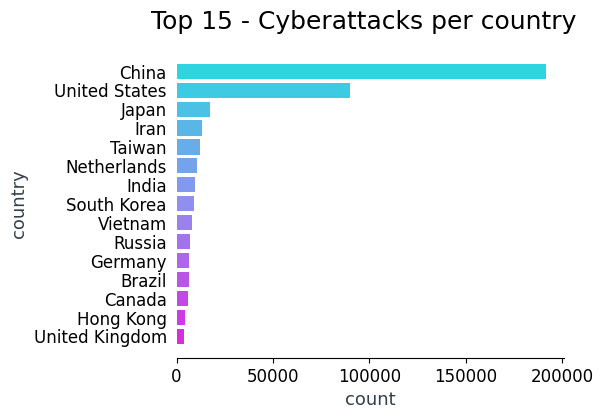

In [ ]:
bar_plot_data(df, 'country', 'Top 15 - Cyberattacks per country')

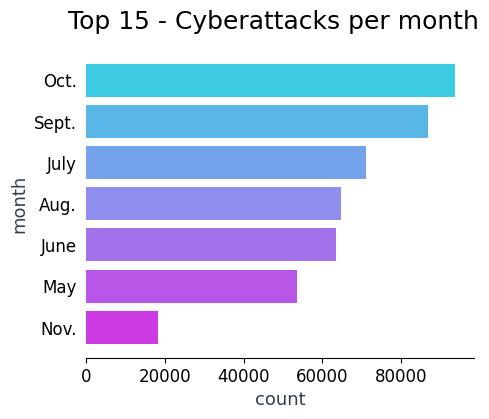

In [ ]:
bar_plot_data(df, 'month', 'Top 15 - Cyberattacks per month')

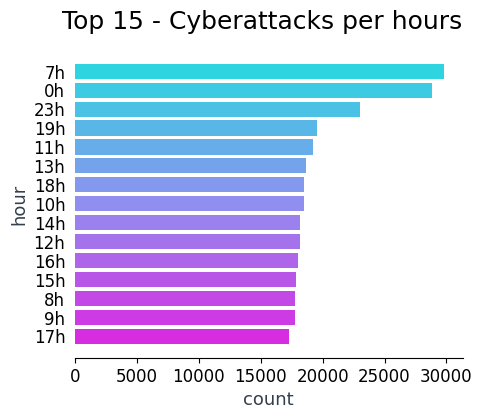

In [ ]:
bar_plot_data(df, 'hour', 'Top 15 - Cyberattacks per hours')

In [ ]:
def get_pie_plot_count(df: dict, field: str, subtitle: str):
    fig, ax1 = plt.subplots(figsize=(10, 6), dpi=100)
    colors = sns.color_palette('cool')
    df_filter = df[field].value_counts().rename_axis(field).reset_index(name='counts')
    ax1.tick_params(axis='both', which='both', labelsize=12, bottom=True, left=False)
    plt.pie(df_filter['counts'], colors=colors, labels=df_filter[field], autopct = '%0.0f%%',
            startangle=90,  textprops={'fontsize': 14})

    plt.plot(color="white", lw=3)
    fig.suptitle(subtitle, fontsize=18)
    plt.show()

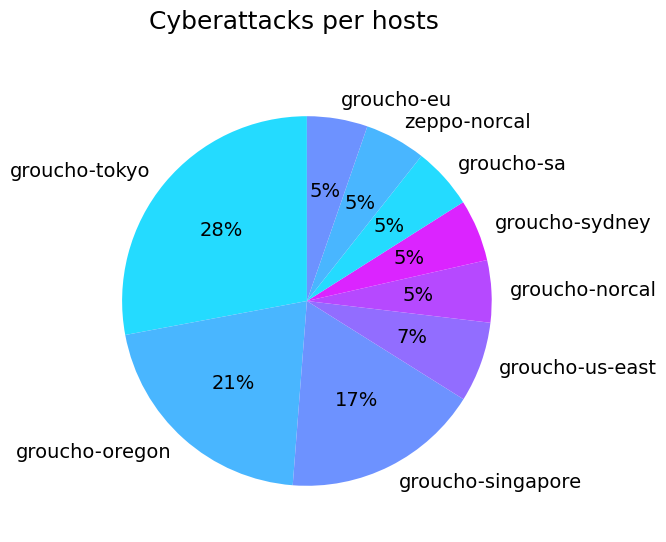

In [ ]:
get_pie_plot_count(df, 'host', 'Cyberattacks per hosts')

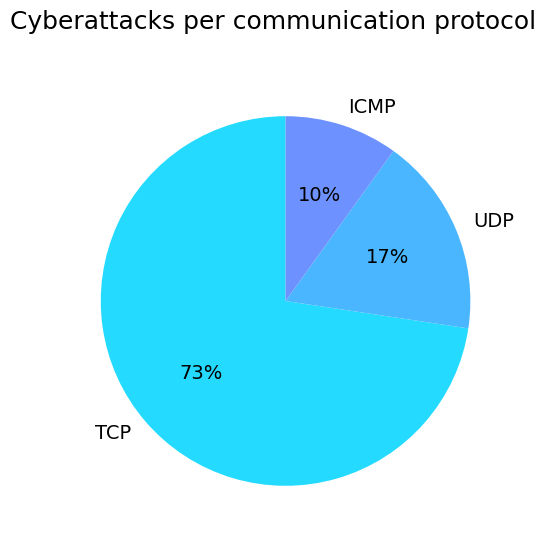

In [ ]:
get_pie_plot_count(df, 'proto', 'Cyberattacks per communication protocol')

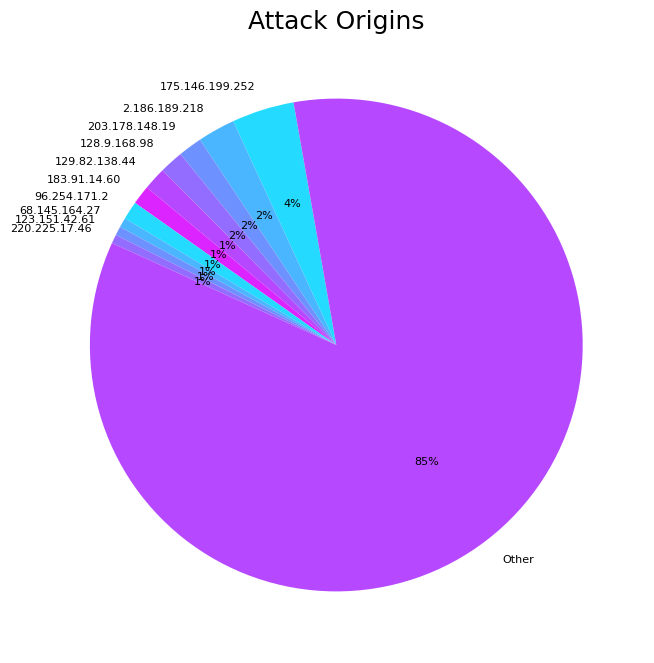

In [ ]:
dt = df
origin_counts = dt['srcstr'].value_counts()
top_origins = origin_counts[:10]
other_count = origin_counts[10:].sum()
top_origins['Other'] = other_count

fig, ax1 = plt.subplots(figsize=(10, 8), dpi=100)
colors = sns.color_palette('cool')
plt.pie(top_origins.values, colors=colors, labels=top_origins.index, autopct = '%0.0f%%',
            startangle=100,  textprops={'fontsize': 8})

plt.plot(color="white", lw=3)
plt.title('Attack Origins', fontsize=18)
plt.show()

In [ ]:
def get_histplot_central_tendency(df: dict, fields: list):
    colors = sns.color_palette('cool')
    for field in fields:
        f, (ax1) = plt.subplots(figsize=(10, 5), dpi=100)
        v_dist_1 = df[field].values

        for spline in ['top', 'right', 'left']:
            ax1.spines[spline].set_visible(False)

        sns.histplot(v_dist_1, ax=ax1, palette=colors, kde=True)

        mean=df[field].mean()
        median=df[field].median()
        mode=df[field].mode().values[0]

        ax1.axvline(mean, color='r', linestyle='--', label="Mean")
        ax1.axvline(median, color='g', linestyle='-', label="Mean")
        ax1.axvline(mode, color='b', linestyle='-', label="Mode")
        ax1.tick_params(axis='both', which='both', labelsize=12, bottom=True, left=False)
        ax1.set_xlabel(f'count', fontsize=13, color = '#333F4B')
        ax1.set_ylabel(f'{field}', fontsize=13, color = '#333F4B')
        ax1.legend()
        plt.grid(False)
        plt.plot(color="white", lw=3)
        f.suptitle(f"Representation Histogram for {field}", fontsize=18)

<ipython-input-14-15714ee68155>:10: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(v_dist_1, ax=ax1, palette=colors, kde=True)
<ipython-input-14-15714ee68155>:10: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(v_dist_1, ax=ax1, palette=colors, kde=True)


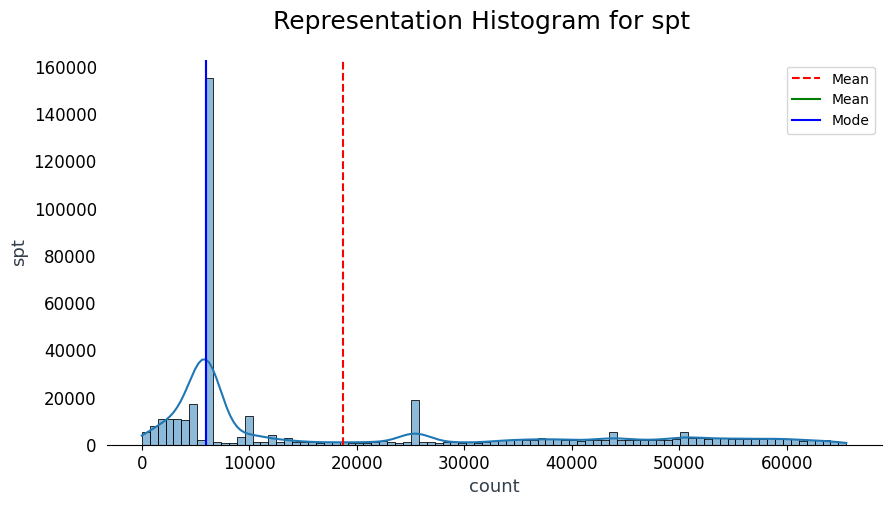

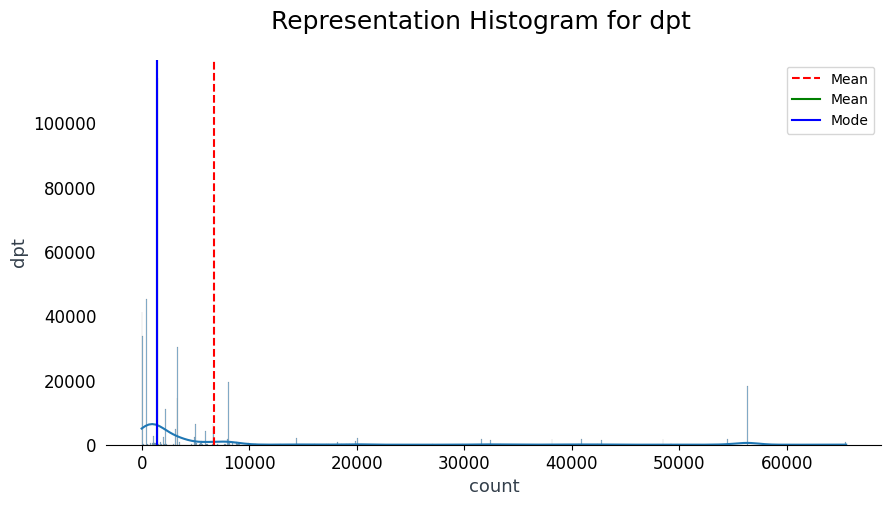

In [ ]:
get_histplot_central_tendency(df, ['spt', 'dpt'])

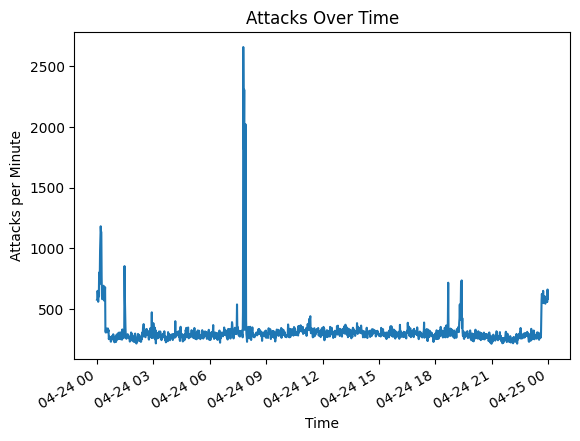

In [ ]:
dt = pd.DataFrame(df['time'])
dt['time'] = pd.to_datetime(dt['time'])
dt.set_index('time', inplace=True)

# Calculate the number of attacks per minute
attacks_per_minute = dt.resample('T').size()

# Create a line chart of attack times
plt.plot(attacks_per_minute.index, attacks_per_minute.values)
plt.title('Attacks Over Time')
plt.xlabel('Time')
plt.ylabel('Attacks per Minute')

# Rotate x-axis labels by 45 degrees
plt.gcf().autofmt_xdate()

plt.show()

In [ ]:
import folium
from folium.plugins import HeatMap

attack= df[['latitude','longitude']]
attack.latitude.fillna(0, inplace = True)
attack.longitude.fillna(0, inplace = True)

World =folium.Map(location=[0,0],zoom_start=2)
HeatMap(data=attack, radius=16).add_to(World)

print('Top cyberattacks by country')
World

<ipython-input-17-e0e84607f0f4>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  attack.latitude.fillna(0, inplace = True)
<ipython-input-17-e0e84607f0f4>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  attack.longitude.fillna(0, inplace = True)


Top cyberattacks by country


In [ ]:
df_filter = df[(df.host == "groucho-oregon") & (df.month == "May") & (df.hour == "20h")]
df_filter

,datetime,host,src,proto,spt,dpt,srcstr,cc,country,locale,localeabbr,postalcode,latitude,longitude,year,month,day,time,hour
1437,3/4/13 20:00,groucho-oregon,2036715561,TCP,27984.0,22.0,121.101.208.41,CN,China,Beijing Shi,11,NaN,39.9289,116.3883,13,May,4,20:00,20h
1441,3/4/13 20:05,groucho-oregon,3736745024,TCP,6000.0,1433.0,222.186.52.64,CN,China,Jiangsu Sheng,32,NaN,32.0617,118.7778,13,May,4,20:05,20h
1442,3/4/13 20:06,groucho-oregon,3658020275,TCP,6000.0,1433.0,218.8.245.179,CN,China,Heilongjiang Sheng,23,NaN,45.7500,126.6500,13,May,4,20:06,20h
1444,3/4/13 20:08,groucho-oregon,3630406730,TCP,6000.0,1433.0,216.99.156.74,US,United States,California,CA,91789,34.0115,-117.8535,13,May,4,20:08,20h
1445,3/4/13 20:09,groucho-oregon,1019141837,TCP,6000.0,1433.0,60.190.222.205,CN,China,NaN,NaN,NaN,35.0000,105.0000,13,May,4,20:09,20h
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53246,3/31/13 20:46,groucho-oregon,1995742862,TCP,6000.0,1433.0,118.244.158.142,CN,China,Beijing Shi,11,NaN,39.9289,116.3883,13,May,31,20:46,20h
53248,3/31/13 20:49,groucho-oregon,3736734735,TCP,6000.0,1433.0,222.186.12.15,CN,China,Jiangsu Sheng,32,NaN,32.0617,118.7778,13,May,31,20:49,20h
53249,3/31/13 20:49,groucho-oregon,3689613428,TCP,6000.0,1433.0,219.235.8.116,CN,China,Beijing Shi,11,NaN,39.9289,116.3883,13,May,31,20:49,20h
53258,3/31/13 20:52,groucho-oregon,3683824005,TCP,6000.0,1433.0,219.146.177.133,CN,China,Shandong Sheng,37,NaN,36.6683,116.9972,13,May,31,20:52,20h


TPC == green
UDP == red
ICMP == orange


/usr/local/lib/python3.9/dist-packages/networkx/drawing/nx_pylab.py:304: UserWarning: 

The arrowstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default value for arrowstyle.
Note that using FancyArrowPatches may be slow for large graphs.

  draw_networkx_edges(G, pos, arrows=arrows, **edge_kwds)


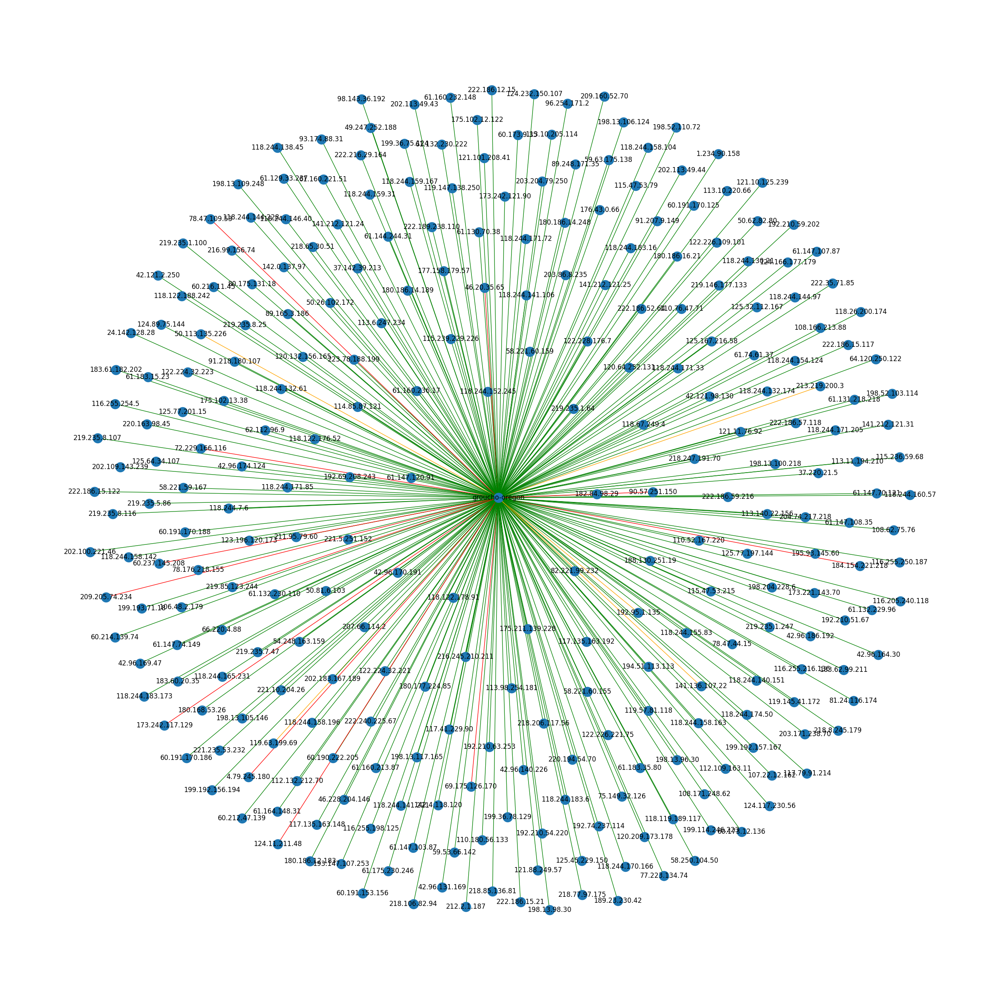

In [ ]:
import networkx as nx

G = nx.Graph()
G.add_node('groucho-oregon', color='red')

ip_listx = []
edge_color = []
for ip, proto in zip(df_filter['srcstr'], df_filter['proto']):
    if ip not in ip_listx:
        if 'TCP' == proto:
            edge_color.append('green')
        if 'UDP' == proto:
            edge_color.append('red')
        if 'ICMP' == proto:
            edge_color.append('orange')
        G.add_node(ip)
        ip_listx.append(ip)

for ip in ip_listx:
    G.add_edge('groucho-oregon', ip)
fig = plt.figure(1, figsize=(25, 25), dpi=100)
print('TPC == green\nUDP == red\nICMP == orange')
nx.draw(G, with_labels=True, font_weight='normal', edge_color=edge_color, arrowsize=30, arrowstyle='fancy')

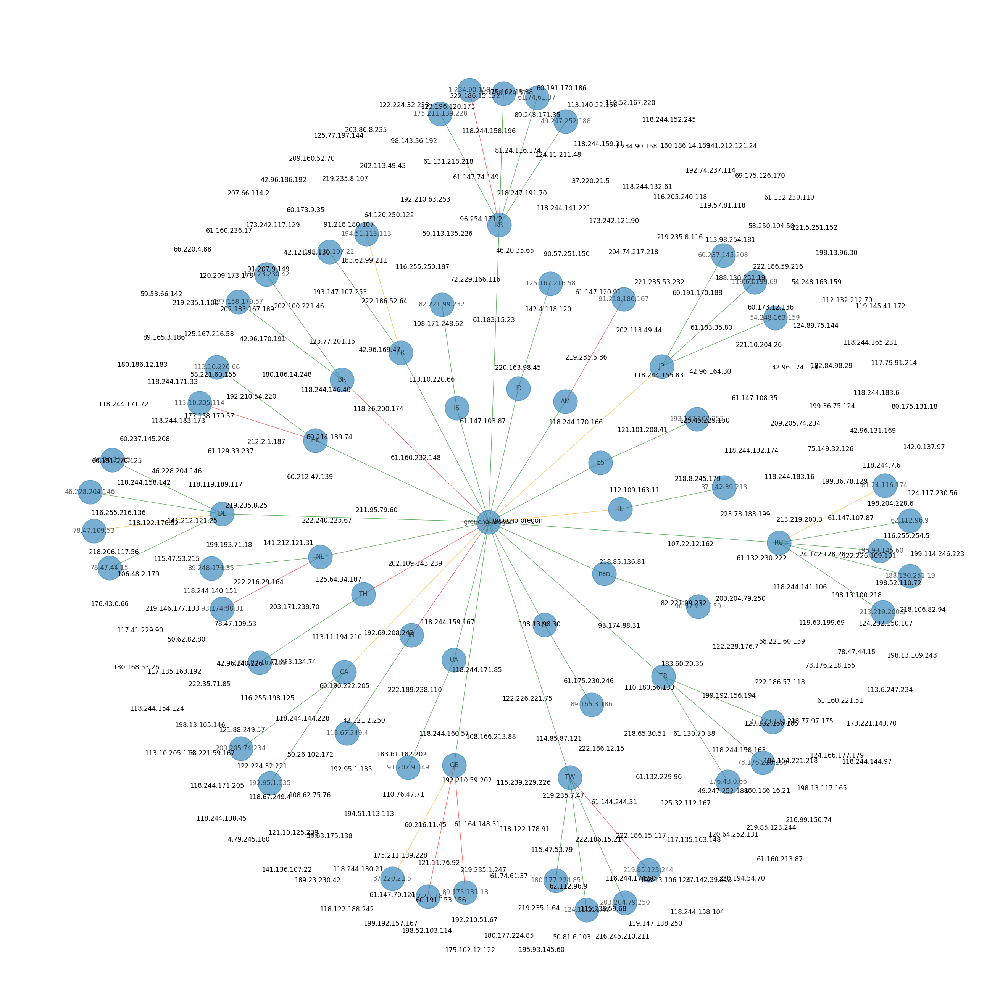

In [ ]:
from matplotlib.pyplot import figure, text

Gx = nx.Graph()
Gx.add_node('groucho-oregon')

country_list = []
ip_list = []
edge_color = []
for country, ip, proto in zip(df_filter['cc'], df_filter['srcstr'], df_filter['proto']):
    if country != 'CN' and country != 'US':
        if country not in country_list:
            Gx.add_node(country)
            country_list.append(country)

        if ip not in ip_list:
            if 'TCP' == proto:
                edge_color.append('green')
            if 'UDP' == proto:
                edge_color.append('red')
            if 'ICMP' == proto:
                edge_color.append('orange')

            Gx.add_node(ip)
            Gx.add_edge(country, ip)
            ip_list.append(ip)


for country in country_list:
    Gx.add_edge('groucho-oregon', country)

options = {
    "node_color": "black",
    "node_size": 50,
    "linewidths": 0,
    "width": 0.1,
}


pos = nx.spring_layout(G)
d = dict(G.degree)
fig = plt.figure(figsize=(26, 26), dpi=100)
nx.draw(Gx, alpha=0.6, node_size=2050, with_labels=True, font_weight='normal',
        edge_color=edge_color, arrowsize=30, arrowstyle='fancy')

for node, (x, y) in pos.items():
    text(x, y, node, fontsize=12)

#**PCA Analysis**

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Load the dataset
d = df
d = d.drop('datetime', axis=1)

from sklearn import preprocessing
le = preprocessing.LabelEncoder()

d.host = le.fit_transform(d.host)
d.proto = le.fit_transform(d.proto)
d.cc = le.fit_transform(d.cc)
d.country = le.fit_transform(d.country)
d.locale = le.fit_transform(d.locale)
d.month = le.fit_transform(d.month)

# Separate the features from the target variable
d = d.drop('srcstr', axis=1)
d = d.drop('localeabbr', axis=1)
d = d.drop('time', axis=1)
d = d.drop('hour', axis=1)
d = d.drop('postalcode', axis=1)
X = d
X=X.dropna()
X.head()

,host,src,proto,spt,dpt,cc,country,locale,latitude,longitude,year,month,day
0,2,1032051418,1,6000.0,1433.0,34,36,390,28.5500,115.9333,13,3,3
1,2,1347834426,2,5270.0,5060.0,41,57,1179,51.0000,9.0000,13,3,3
2,2,2947856490,1,2489.0,1080.0,159,157,1020,25.0392,121.5250,13,3,3
3,7,841842716,2,43235.0,1900.0,163,169,681,45.5848,-122.9117,13,3,3
4,4,3587648279,1,56577.0,80.0,54,54,1179,48.8600,2.3500,13,3,3


In [ ]:
X.isnull().sum()

host         0
src          0
proto        0
spt          0
dpt          0
cc           0
country      0
locale       0
latitude     0
longitude    0
year         0
month        0
day          0
dtype: int64

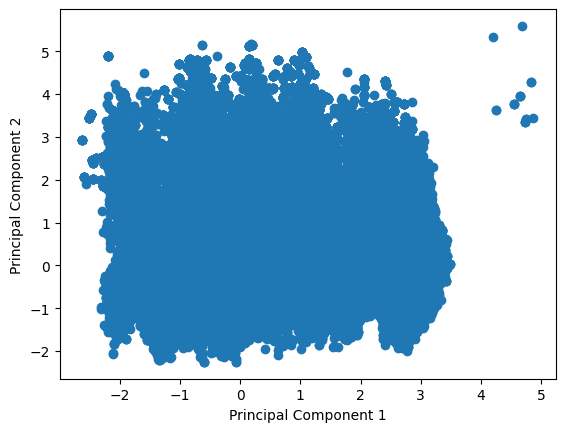

In [ ]:
# Standardize the feature values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Visualize the transformed data
plt.scatter(X_pca[:, 0], X_pca[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In [ ]:
t = df
t = t.drop('datetime', axis=1)
t = t.drop('srcstr', axis=1)
t = t.drop('localeabbr', axis=1)
t = t.drop('time', axis=1)
t = t.drop('hour', axis=1)
t = t.drop('postalcode', axis=1)

from sklearn import preprocessing
le = preprocessing.LabelEncoder()

t.host = le.fit_transform(t.host)
t.proto = le.fit_transform(t.proto)
t.cc = le.fit_transform(t.cc)
t.locale = le.fit_transform(t.locale)
t.month = le.fit_transform(t.month)
t = t.dropna()
#t.country = le.fit_transform(t.country)
t.head()

,host,src,proto,spt,dpt,cc,country,locale,latitude,longitude,year,month,day
0,2,1032051418,1,6000.0,1433.0,34,China,390,28.5500,115.9333,13,3,3
1,2,1347834426,2,5270.0,5060.0,41,Germany,1179,51.0000,9.0000,13,3,3
2,2,2947856490,1,2489.0,1080.0,159,Taiwan,1020,25.0392,121.5250,13,3,3
3,7,841842716,2,43235.0,1900.0,163,United States,681,45.5848,-122.9117,13,3,3
4,4,3587648279,1,56577.0,80.0,54,France,1179,48.8600,2.3500,13,3,3


<ipython-input-25-e90cb8c8a0e6>:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('hsv', len(country_values))
<ipython-input-25-e90cb8c8a0e6>:35: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(A_pca_2d[mask, 0], A_pca_2d[mask, 1], c=color_map(i), marker='o', label=country)
<ipython-input-25-e90cb8c8a0e6>:47: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Color

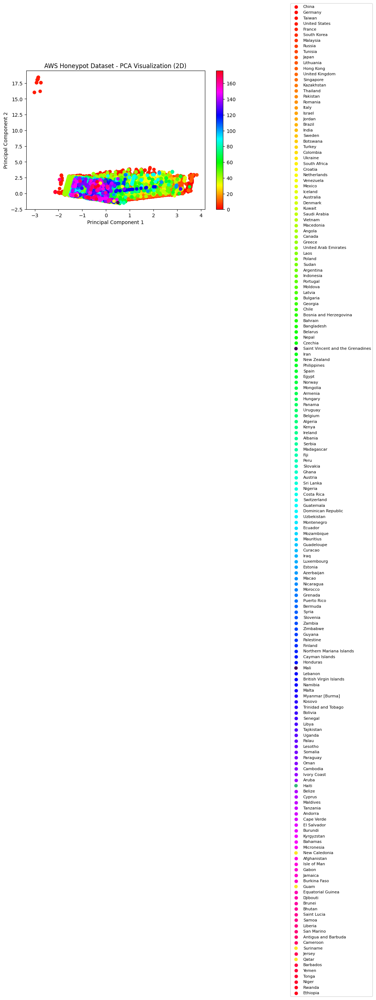

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load the dataset
#df = pd.read_csv('aws_honeypot_dataset.csv')
# Select the columns for PCA visualization
columns = ['spt', 'dpt', 'latitude', 'longitude']

# Separate the features from the target variable
A = t[columns]
A=A.dropna()
# Standardize the feature values
scaler = StandardScaler()
A_scaled = scaler.fit_transform(A)

# Perform PCA with 2 components
pca = PCA(n_components=2)
A_pca_2d = pca.fit_transform(A_scaled)

# Perform PCA with 3 components
pca = PCA(n_components=3)
A_pca_3d = pca.fit_transform(A_scaled)

# Create a color map for country column values
country_values = t['country'].unique()
color_map = plt.cm.get_cmap('hsv', len(country_values))

# Visualize the transformed data with color-coded data points in 2D
fig, ax = plt.subplots(figsize=(8, 5))
for i, country in enumerate(country_values):
    mask = t['country'] == country
    ax.scatter(A_pca_2d[mask, 0], A_pca_2d[mask, 1], c=color_map(i), marker='o', label=country)

# Set the plot labels and title
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_title('AWS Honeypot Dataset - PCA Visualization (2D)')

# Add legends and colorbar
#ax.legend(fontsize="15", loc ="upper left")
ax.legend(bbox_to_anchor=(1.95, 1.50), fontsize="8")
sm = plt.cm.ScalarMappable(cmap=color_map, norm=plt.Normalize(vmin=0, vmax=len(country_values)-1))
sm.set_array([])
fig.colorbar(sm)

# Show the plot
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Read the dataset
dx = d

# Normalize the data
for col in dx.columns:
    if col != 'datetime' and col != 'host' and col != 'src' and col != 'proto' and col != 'type':
        dx[col] = dx[col].astype('float')
        dx[col] = dx[col] / dx[col].max()

dx = dx.dropna()
dx.isnull().sum()

host         0
src          0
proto        0
spt          0
dpt          0
cc           0
country      0
locale       0
latitude     0
longitude    0
year         0
month        0
day          0
dtype: int64

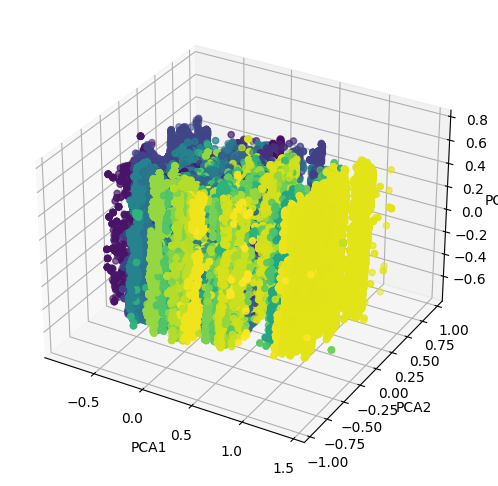

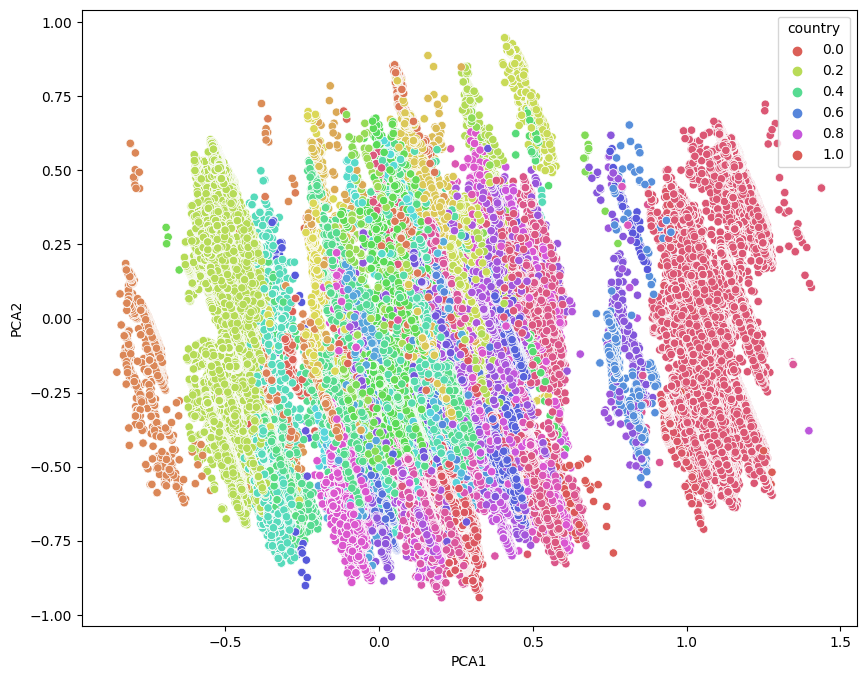

In [ ]:
# Perform PCA
pca = PCA(n_components=3)
#pca_transformed = pca.fit_transform(dx.drop(['datetime', 'host', 'src', 'proto', 'type'], axis=1))
pca_transformed = pca.fit_transform(dx.drop(['host', 'src', 'proto'], axis=1))

# Visualize PCA dimensions
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_transformed[:,0], pca_transformed[:,1], pca_transformed[:,2], c=dx['country'], cmap='viridis')
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('PCA3')
plt.show()

# 2D Visualization
plt.figure(figsize=(10,8))
sns.scatterplot(x=pca_transformed[:,0], y=pca_transformed[:,1], hue=dx['country'], palette='hls')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.show()